# Load Field data, SAM and DAS result files and run cap test
## code is designed for captest 0.10.  Needs to be updated for 0.11.2

In [1]:
run = 'SAM_00' # which SAM outputfile and input weatherfile to use

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import pvlib
import numpy as np
import os
import re
from pathlib import Path
from datetime import datetime
from copy import deepcopy
import time
starttime = time.time()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
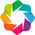

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
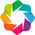

Loading BokehJS ...

PVCaptest version: 0.10.0


In [3]:
# Import PVCaptest.  This requires v0.10 to work (for now)!

from captest_subroutines import setupSAM, setupDAS, saveFilter, RMSE, MBE, MAE, runCaptest, plotAlbedo
from captest_subroutines import runIEC, savePowervPOA

# pip install pvcaptest and holoviews if you don't have it installed already.
# following example from https://pvcaptest.readthedocs.io/en/latest/examples/complete_capacity_test.html

#import captest as pvc
import captest as ct
from captest import capdata as pvc
from bokeh.io import output_notebook, show

# uncomment below two lines to use cptest.scatter_hv in notebook
import holoviews as hv
hv.extension('bokeh')

#if working offline with the CapData.plot() method may fail
#run 'export BOKEH_RESOURCES=inline' at the command line before
#running the jupyter notebook

output_notebook()
print(f'PVCaptest version: {ct.__version__}')

In [4]:
BifiFactors = {2: 0.694, 4: 0.73, 5: 0.633, 7: 0.73, 9:0.87} 
# use post-degradation numbers of front & back Pmp.  Data doesn't exist for Row 4.
BifiFactors = {2: 0.708, 4: 0.73, 5: 0.614, 7: 0.749, 9:0.894}

In [5]:
fielddataFolder = 'FieldData'
InputFilesFolder = 'InputFiles'
#SAMResultsFolder = os.path.join(os.path.dirname(os.getcwd()), 'SAM','Results')
if not os.path.exists(os.path.join('images',run)):
   os.makedirs(os.path.join('images',run))

if not os.path.exists(os.path.join('results','filter')):
   os.makedirs(os.path.join('results','filter'))


plt.rcParams.update({'font.size': 22})
plt.rcParams['figure.figsize'] = (12, 4)

In [6]:
# Open the SAM simulation file, and save to the Analysis/data folder with updated header names
samfile = f'Results_py{run}.csv'

df = pd.read_csv(r'../SAM/Results/'+ samfile)
weatherfile = os.path.join(Path(os.getcwd()).parent,InputFilesFolder,f'WF_{run}.csv')
df_weather = pd.read_csv(weatherfile, skiprows=2)

# remove duplicate columns if they exist
cols_to_use = df_weather.columns.difference(df.columns)
df = pd.merge(df, df_weather[cols_to_use], left_index=True, right_index=True, how='outer')

#print(df.head())

In [7]:
# set index and rename columns to something Captest will understand
df.rename(columns={'Tdry':'Tamb', 'Wspd':'Wind'}, inplace=True)
df.rename(columns=lambda x: re.sub('Power','power_dc_inv', x), inplace=True)
df.rename(columns=lambda x: re.sub('CellTemp','tmod', x), inplace=True)
df.rename(columns=lambda x: re.sub('Rear','rear_irr', x), inplace=True)
df.rename(columns=lambda x: re.sub('Front','poa', x), inplace=True)

#from stackexchange:  raw_data = raw_data.rename(columns=lambda x: re.sub(' $','',x))
print(df.columns)



Index(['Unnamed: 0', 'Sim', 'power_dc_inv2', 'tmod2', 'rear_irr2', 'poa2',
       'power_dc_inv4', 'tmod4', 'rear_irr4', 'poa4', 'power_dc_inv8', 'tmod8',
       'poa8', 'power_dc_inv9', 'tmod9', 'rear_irr9', 'poa9', 'DNI', 'DHI',
       'Alb', 'index', 'datetimes', 'Year', 'Month', 'Hour', 'Albedo', 'Day',
       'GHI', 'Tamb', 'Wind'],
      dtype='object')


In [8]:
df.index = pd.to_datetime(df_weather.iloc[:,0:4])  # use YYYY-MM-DD HH:MM index
df = df.loc[:,~df.columns.str.startswith('Unnamed:')]  # remove empty columns
df.to_csv(r'data/'+ samfile)

In [9]:
# load the data from file into the captest object
sam = pvc.CapData('sim')
try:
    sam.load_data(fname=samfile, source='AlsoEnergy')  # the AlsoEnergy flag is needed to make this work.
except AttributeError:
    sam = pvc.load_data(fname=samfile, source='AlsoEnergy')  # the AlsoEnergy flag is needed to make this work.
sam.data.sort_index(inplace=True)
sam.data.index = sam.data.index.tz_localize('Etc/GMT+7')


sam.review_column_groups()
print(sam.regression_formula)
regression_formula0 = sam.regression_formula
regression_formula_tmod = 'power ~ poa + I(poa * poa)+ I(poa * t_amb) - 1'

-inv-
    power_dc_inv2
    power_dc_inv4
    power_dc_inv8
    power_dc_inv9
irr-poa-
    poa2
    poa4
    poa8
    poa9
wind--
    Wind
-mod-
    tmod2
    tmod4
    tmod8
    tmod9
index--
    index
irr-ghi-
    GHI
irr--
    rear_irr2
    rear_irr4
    rear_irr9
--
    Alb
    Albedo
    DHI
    DNI
    Day
    Hour
    Month
    Sim
    Year
    datetimes
temp-amb-
    Tamb
power ~ poa + I(poa * poa)+ I(poa * t_amb) + I(poa * w_vel) - 1


In [10]:
# Load 15-minute field data, 6/1/21 - 5/31/22
das = pvc.CapData('das')
das.load_data(fname='Rows2-9_2021-2022_15T.csv', source='AlsoEnergy')  # the AlsoEnergy flag is needed to make this work.
das.data.sort_index(inplace=True)
das.data = das.data[(das.data['Gfront_poa'].notna()) & (das.data['row2wind_speed'].notna()) &
                   (das.data[f'power_dc_inv2'].notna()) & (das.data[f'power_dc_inv4'].notna()) &
                   (das.data[f'power_dc_inv8'].notna()) & (das.data[f'power_dc_inv9'].notna()) ] 



In [11]:
print(das.data.columns)

Index(['Gfront_poa', 'Grear', 'row2wind_speed', 'temp_ambient_FieldAverage',
       'albedo_down', 'albedo_up', 'row7RotatingAlbedometer_CM11_Down',
       'row7RotatingAlbedometer_CM11_Up', 'Hydra_avg', 'Hydra_min',
       'power_dc_inv2', 'row2tmod_1', 'row2tmod_2', 'power_dc_inv4',
       'row4tmod_1', 'row4tmod_2', 'power_dc_inv8', 'row8tmod_1', 'row8tmod_2',
       'power_dc_inv9', 'row9tmod_1', 'row9tmod_2', 'index'],
      dtype='object')


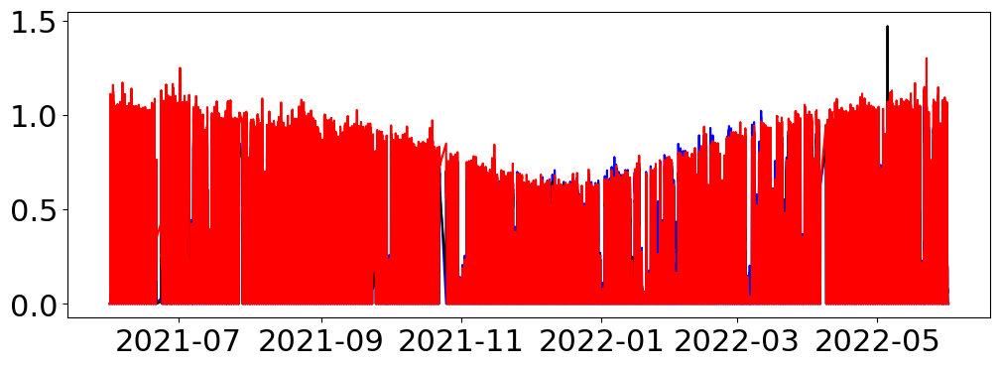

In [12]:
#get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
plt.figure()

plt.plot(das.data['power_dc_inv2'], 'b', label='Row2Pmp')
plt.plot(das.data['power_dc_inv8'], 'k', label='Row8Pmp')
plt.plot(das.data['Gfront_poa']/1000, 'r', label='POA')



In [13]:
# remove snowy data from 2/22/22 - 2/24/22
das.data = das.data[(das.data.index < '2022-02-22') | (das.data.index > '2022-02-24 20:00')]
das.data = das.data[(das.data.index < '2022-03-06') | (das.data.index > '2022-03-07 14:00')]
das.data = das.data[(das.data.index < '2022-03-10') | (das.data.index > '2022-03-11 10:00')]
# remove snowy data on 3/6-3/7, 3/10 - noon 3/11

In [14]:
## Method 4 resource comparison
# look at comparison between Hydra_avg and poa or Gtotal.  Use 9.56 implied Isc from 3/28 field comparison.
rownum = 4
sam.data['Gtotal'] = sam.data[f'poa{rownum}']+sam.data[f'rear_irr{rownum}']*BifiFactors[rownum]
das.data['RefModule'] = das.data['Hydra_avg']*1000 / 9.56
das.data['Gtotal'] = das.data['Gfront_poa']+das.data['Grear']*BifiFactors[rownum]

polyfit_Refmod = np.polyfit(das.data['Gtotal'], das.data['RefModule'], deg=1)


Text(0.5, 1.0, 'RefMod = 0.977 Gtotal')

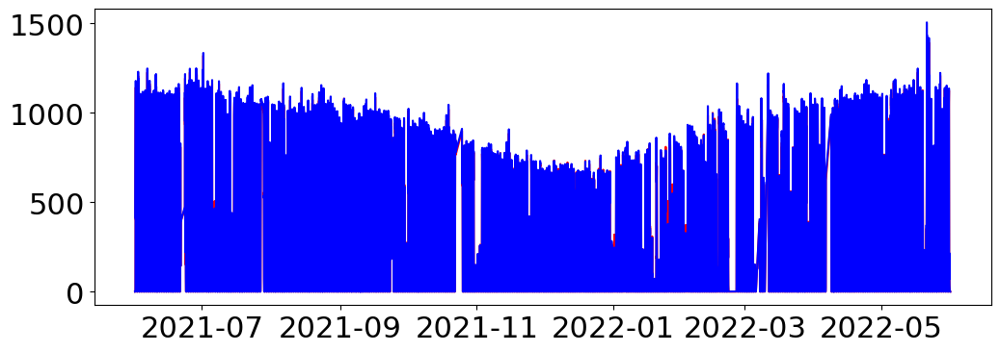

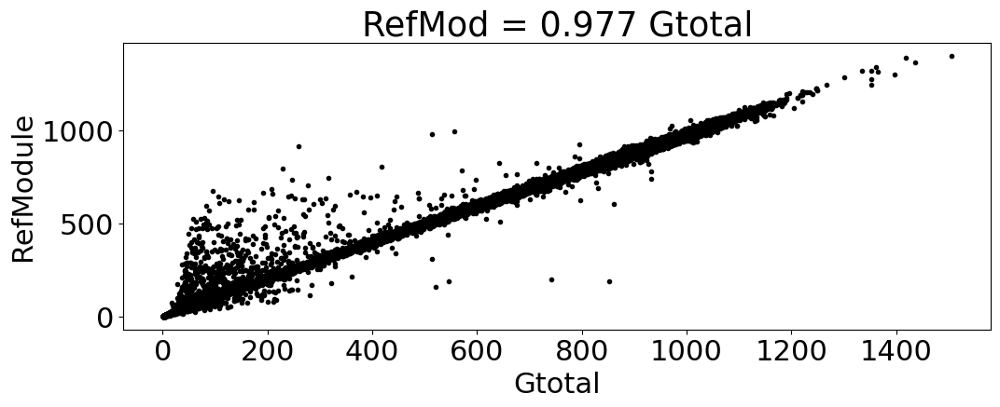

In [15]:
#get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
plt.figure()
plt.plot(das.data['RefModule'], 'r', label='RefModule')
plt.plot(das.data['Gtotal'], 'b', label='Gtotal')

plt.figure()
plt.plot(das.data['Gtotal'], das.data['RefModule'], 'k.')
plt.ylabel('RefModule')
plt.xlabel('Gtotal')
plt.title(f'RefMod = {polyfit_Refmod[0]:0.3f} Gtotal')

<IPython.core.display.Javascript object>


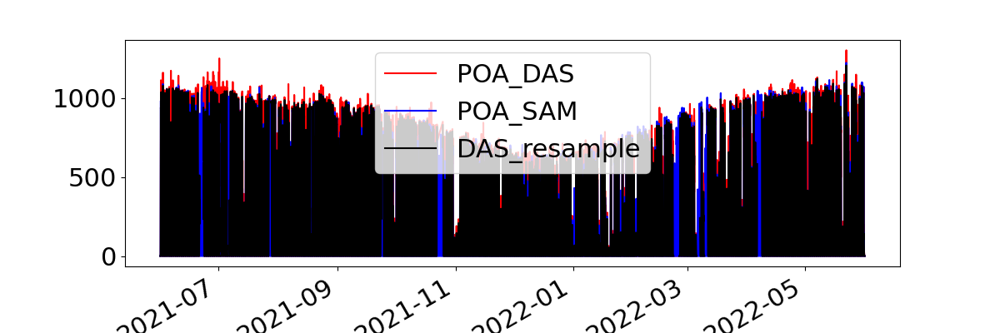

In [16]:
## Plot actual vs expected POA

# reindex DAS time series to hourly
sam.data['das_POA'] = das.data['Gfront_poa'].resample('60T', label='left', closed='left').mean().reindex(sam.data.index)

get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
#get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
fig = plt.figure()
plt.plot(das.data['Gfront_poa'], 'r', label='POA_DAS')
plt.plot(sam.data[f'poa{rownum}'], 'b', label='POA_SAM')
plt.plot(sam.data['das_POA'], 'k', label='DAS_resample')
plt.legend()
fig.autofmt_xdate()


<IPython.core.display.Javascript object>


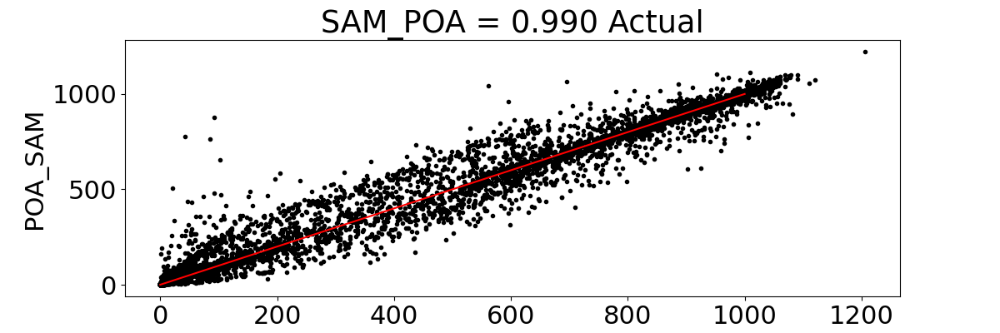

Text(0.5, 1.0, 'SAM_POA = 0.990 Actual')

In [17]:
df = pd.DataFrame({'das_POA':sam.data['das_POA'],'poa4':sam.data[f'poa{rownum}']}).dropna()

polyfit_SAMPOA = np.polyfit(df['das_POA'], df[f'poa{rownum}'], deg=1)
plt.figure()
plt.plot(df['das_POA'], df[f'poa{rownum}'], 'k.')
plt.plot([0,1000],[0,1000],'r')
plt.ylabel('POA_SAM')
plt.xlabel('POA_actual_resample')
plt.title(f'SAM_POA = {polyfit_SAMPOA[0]:0.3f} Actual')

## Method 3 - GTotal from 1/15/22 to 5/31/22
### Using Jeff Newmiller notes from 5/31/23 and PVSyst runs.

Text(0.5, 1.0, 'RotAlb_down = 1.677 Grear')

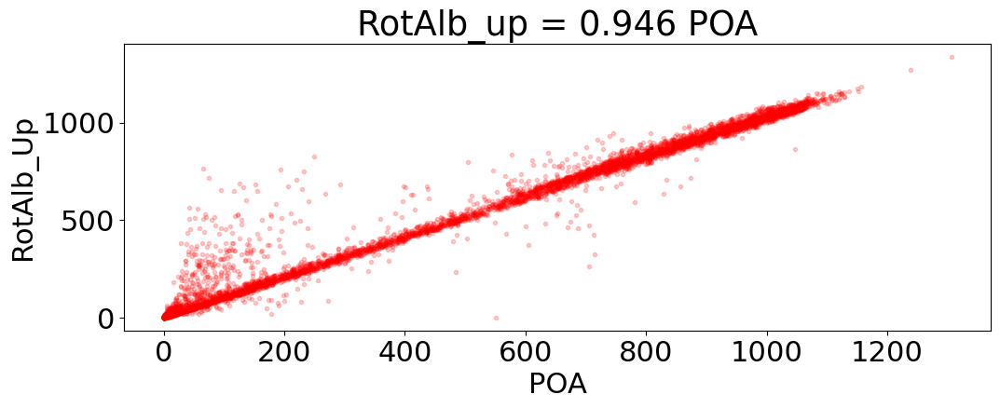

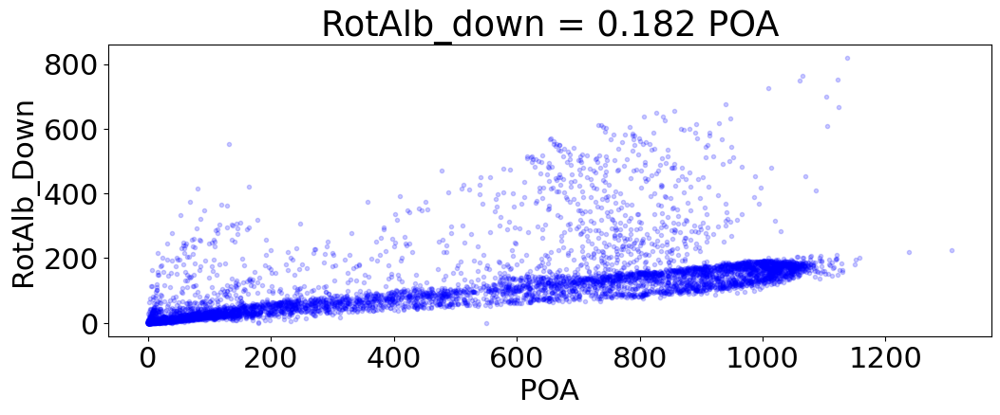

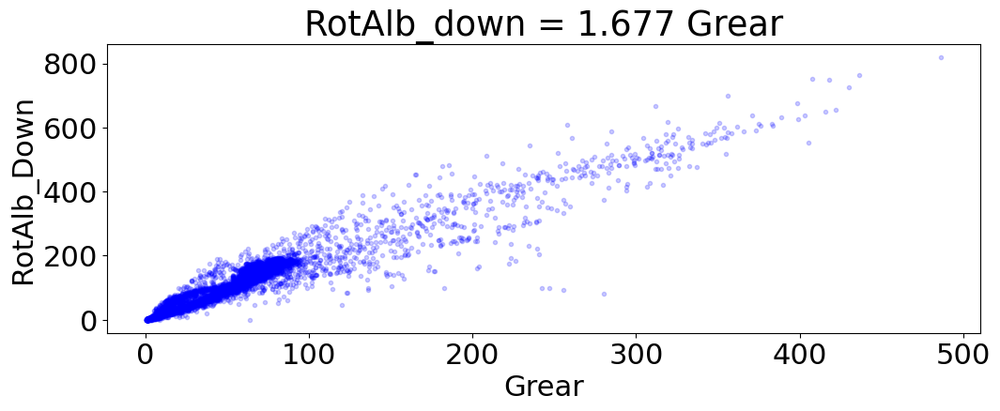

In [19]:
## MEthod 3 resource comparison
das3 = das

get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use

das3.data = das3.data[(das3.data['row7RotatingAlbedometer_CM11_Up'].notna())&(das3.data['row7RotatingAlbedometer_CM11_Down'].notna())]

polyfit_Method3UP = np.polyfit(das3.data['Gtotal'], das3.data['row7RotatingAlbedometer_CM11_Up'], deg=1)
plt.figure()
plt.plot(das3.data['Gfront_poa'], das3.data['row7RotatingAlbedometer_CM11_Up'], 'r.', alpha = 0.2)
plt.ylabel('RotAlb_Up')
plt.xlabel('POA')
plt.title(f'RotAlb_up = {polyfit_Method3UP[0]:0.3f} POA')

polyfit_Method3DOWN = np.polyfit(das3.data['Gtotal'], das3.data['row7RotatingAlbedometer_CM11_Down'], deg=1)
plt.figure()
plt.plot(das3.data['Gfront_poa'], das3.data['row7RotatingAlbedometer_CM11_Down'], 'b.', alpha = 0.2)
plt.ylabel('RotAlb_Down')
plt.xlabel('POA')
plt.title(f'RotAlb_down = {polyfit_Method3DOWN[0]:0.3f} POA')

polyfit_Method3DOWN2 = np.polyfit(das3.data['Grear'], das3.data['row7RotatingAlbedometer_CM11_Down'], deg=1)
plt.figure()
plt.plot(das3.data['Grear'], das3.data['row7RotatingAlbedometer_CM11_Down'], 'b.', alpha = 0.2)
plt.ylabel('RotAlb_Down')
plt.xlabel('Grear')
plt.title(f'RotAlb_down = {polyfit_Method3DOWN2[0]:0.3f} Grear')

## Import PVSyst simulation

In [20]:
# load the data from file into the captest object
#pvsystfile = 'Sim_00.CSV'
pvsystpath = r'C:\Users\cdeline\Documents\Python Scripts\2022_Bifacial_irradiance_paper\PVSyst\\'


pvsyst_bifi = pvc.CapData('sim')
pvsyst_bifi.load_data(path=pvsystpath, fname='Sim_00_Row4.CSV', load_pvsyst=True, delimiter = ',')  

pvsyst_mono = pvc.CapData('sim')
pvsyst_mono.load_data(path=pvsystpath, fname='Sim_00_Monofacial.CSV', load_pvsyst=True, delimiter = ',')  

50.118 in ShdLoss is above 1 for shade
1.9672 in ShdBLss is above 1 for shade
30.99 in ShdDLss is above 1 for shade
23.754 in ShdALss is above 1 for shade
5.3719 in BackShd is above 1 for shade
50.118 in ShdLoss is above 1 for shade
1.9672 in ShdBLss is above 1 for shade
30.99 in ShdDLss is above 1 for shade
23.754 in ShdALss is above 1 for shade


In [21]:
pvsyst_mono.data.sort_index(inplace=True)
pvsyst_mono.data.index = pvsyst_mono.data.index.tz_localize('Etc/GMT+7')

pvsyst_bifi.data.sort_index(inplace=True)
pvsyst_bifi.data.index = pvsyst_bifi.data.index.tz_localize('Etc/GMT+7')


pvsyst_mono.review_column_groups()


index--
    index
temp--
    TempLss
irr-ghi-
    GlobHor
--ref_cell
    EArrRef
irr--
    GlobEff
    GlobIAM
    GlobShd
    GlobTrp
    IRR
temp-mod-
    TArray
op_state--
    AvgOpCost_yr
    IL_Oper
shade--
    FIAMShd
    FShdAlb
    FShdBm
    FShdCrc
    FShdDif
    FShdGl
    ShdALss
    ShdBLss
    ShdCLss
    ShdDLss
    ShdLoss
real_pwr--
    E_Grid
temp-amb-
    FIAMBm
    IAMBLss
    T_Amb
--
    AlbTrp
    Alb_Eff
    Alb_Gl
    Alb_Inc
    AngInc
    AngProf
    ArrayON
    AzSol
    BatteryCost
    BeamEff
    BeamHor
    BeamInc
    BeamTrp
    Bm_Gl
    CircEff
    CircInc
    CircTrp
    DTArr
    DTArrGl
    DifA_Gl
    DifITrp
    DifSInc
    DifS_Gl
    DiffEff
    DiffHor
    EArrMPP
    EArrNom
    EArray
    EUseful
    EffArrC
    EffArrR
    EffSysC
    EffSysR
    FEffAlb
    FEffDif
    FIAMAlb
    FIAMCrc
    FIAMDif
    FIAMGl
    FTransp
    GIncLss
    GincThr
    HBndTrp
    HSol
    IAMALss
    IAMCLss
    IAMDLss
    IAMLoss
    IArray
    IL_Imax
 

In [22]:
# PVSyst data is for year 1990, tz-naive.  Restrict to 1/15 - 5/31 and translate to 2022
pvsyst_mono.data = pvsyst_mono.data[(pvsyst_mono.data.index > '1990-01-15') & (pvsyst_mono.data.index < '1990-06-01')]
pvsyst_mono.data.index = pvsyst_mono.data.index + pd.DateOffset(years=32)


pvsyst_bifi.data = pvsyst_bifi.data[(pvsyst_bifi.data.index > '1990-01-15') & (pvsyst_bifi.data.index < '1990-06-01')]
pvsyst_bifi.data.index = pvsyst_bifi.data.index + pd.DateOffset(years=32)

In [23]:
# add albedo column from das3
albedo = (das3.data.albedo_down / das3.data.albedo_up).clip(lower=0, upper=0.999).resample('1D').mean()
albedo.name = 'albedo'
albedo = albedo.reindex(pvsyst_bifi.data.index, method='ffill')

pvsyst_bifi.data = pvsyst_bifi.data.join(albedo)


pvsyst_bifi.data = pvsyst_bifi.data.join(das3.data['row7RotatingAlbedometer_CM11_Down'].resample('60T', label='left', closed='left').mean())
pvsyst_bifi.data = pvsyst_bifi.data.dropna()

In [24]:
print([k for k in pvsyst_bifi.data.columns])

['EArray', 'E_Grid', 'PR', 'GlobHor', 'DiffHor', 'BeamHor', 'T_Amb', 'WindVel', 'BeamTrp', 'DifITrp', 'CircTrp', 'HBndTrp', 'AlbTrp', 'GlobTrp', 'FTransp', 'FShdGl', 'FShdBm', 'FShdCrc', 'FShdDif', 'FShdAlb', 'FIAMGl', 'FIAMBm', 'FIAMCrc', 'FIAMDif', 'FIAMAlb', 'FIAMShd', 'FEffDif', 'FEffAlb', 'EArrRef', 'EArrNom', 'GIncLss', 'TempLss', 'ModQual', 'MisLoss', 'OhmLoss', 'EArrMPP', 'TExtON', 'TArray', 'TArrWtd', 'DTArr', 'DTArrGl', 'IArray', 'UArray', 'ArrayON', 'InvLoss', 'IL_Oper', 'IL_Pmin', 'IL_Vmin', 'IL_Pmax', 'IL_Vmax', 'IL_Imax', 'Syst_ON', 'EOutInv', 'EUseful', 'EffArrR', 'EffArrC', 'EffSysR', 'EffSysC', 'EffInvB', 'EffInvR', 'Yr', 'Ya', 'Yf', 'Lc', 'Ls', 'Lcr', 'Lsr', 'TotInstCost', 'ModuleCost', 'InverterCost', 'BatteryCost', 'OwnFunds', 'TotLoan', 'AvgOpCost_yr', 'LCOE', 'NPV', 'IRR', 'PaybackPeriod', 'ROI', 'HSol', 'AzSol', 'AngInc', 'AngProf', 'PhiAng', 'MismBak', 'GincThr', 'GlobInc', 'BeamInc', 'CircInc', 'DifSInc', 'Alb_Inc', 'Bm_Gl', 'DifA_Gl', 'DifS_Gl', 'Alb_Gl', 'Glo

In [25]:
# calculation of Jeff model details.  Requires following columns of df_pvsyst:
#['GlobInc', 'DiffHor', 'T_Amb', 'WindVel', 'GlobHor', 'Alb_Inc', 'GlobGnd', 'BkVFLss', 'DifSBak', 'PhiAng', 'BmIncBk', 'HSol', 'AzSol']
dtor = np.pi/180
cos = np.cos;  sin = np.sin

L = 3 # distance (m) of opposed tracked albedometer south of shading module
H = 1.5 # tracker torque tube height (m)

Esky_rear = (1-np.abs(cos(pvsyst_bifi.data.PhiAng *dtor)))/2 * pvsyst_bifi.data.DiffHor
phi = np.arccos(cos(pvsyst_bifi.data.HSol*dtor) * cos(pvsyst_bifi.data.AzSol*dtor))
cos_psi = (L*sin(phi) + H*cos(phi)) / (np.sqrt(L*L*sin(phi)*sin(phi) + 2*L*H*cos(phi)*sin(phi)+ H*H))
W = (1+cos_psi)/2

E_gnd_rear = W* (pvsyst_bifi.data.GlobHor * pvsyst_bifi.data.albedo - pvsyst_bifi.data.Alb_Inc ) + \
    (1-W)*(pvsyst_bifi.data.GlobGnd * (pvsyst_bifi.data.albedo/0.35) - pvsyst_bifi.data.BkVFLss)

E_rear_calc = E_gnd_rear + pvsyst_bifi.data.BmIncBk + Esky_rear
pvsyst_bifi.data['E_rear_calc'] = E_rear_calc

<IPython.core.display.Javascript object>


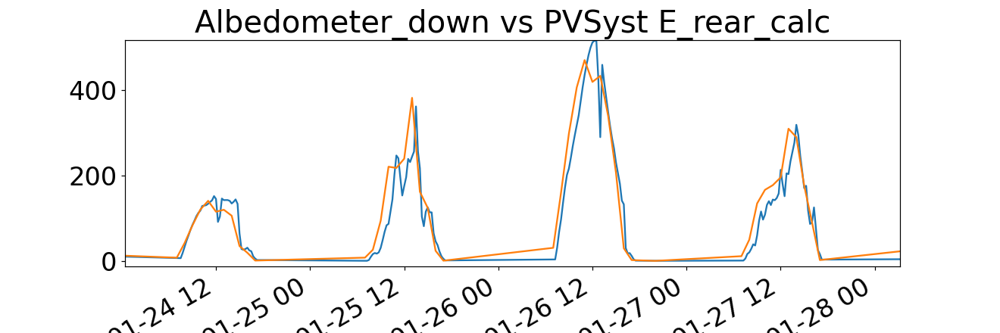

Text(0.5, 1.0, 'Albedometer_down vs PVSyst E_rear_calc')

In [26]:
get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
#get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
fig=plt.figure()
plt.plot(das3.data['row7RotatingAlbedometer_CM11_Down'])


# plot E_rear_calc as a comparison
plt.plot(E_rear_calc)
fig.autofmt_xdate()
plt.title('Albedometer_down vs PVSyst E_rear_calc')

Text(0.5, 1.0, 'RotAlb_down = 0.915 Modeled')

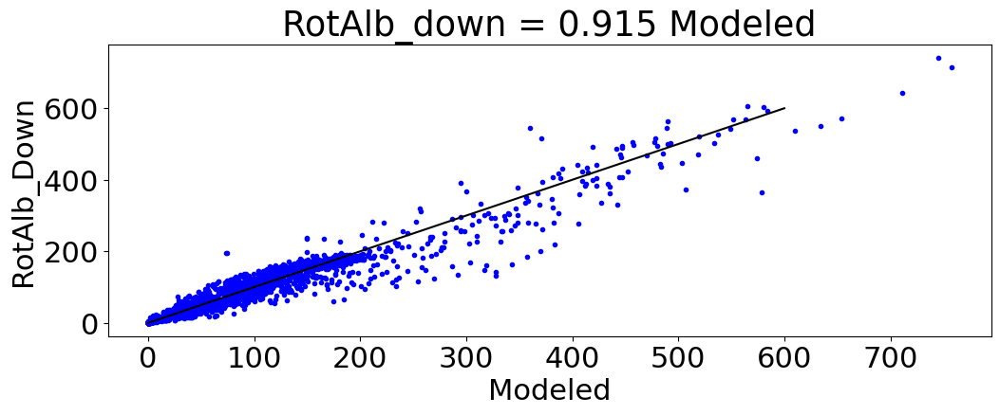

In [27]:
#get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
toplot = pvsyst_bifi.data[['E_rear_calc','row7RotatingAlbedometer_CM11_Down']]



polyfit_Method3 = np.polyfit(toplot['E_rear_calc'], toplot['row7RotatingAlbedometer_CM11_Down'], deg=1)
plt.figure()


plt.plot(toplot['E_rear_calc'], toplot['row7RotatingAlbedometer_CM11_Down'],'b.')
plt.plot([0,600],[0,600],'k')
plt.ylabel('RotAlb_Down')
plt.xlabel('Modeled')
plt.title(f'RotAlb_down = {polyfit_Method3[0]:0.3f} Modeled')


In [33]:
print([k for k in das3.data.columns])
print([k for k in pvsyst_mono.data.columns])

['Gfront_poa', 'Grear', 'row2wind_speed', 'temp_ambient_FieldAverage', 'albedo_down', 'albedo_up', 'row7RotatingAlbedometer_CM11_Down', 'row7RotatingAlbedometer_CM11_Up', 'Hydra_avg', 'power_dc_inv2', 'row2tmod_1', 'row2tmod_2', 'power_dc_inv4', 'row4tmod_1', 'row4tmod_2', 'power_dc_inv8', 'row8tmod_1', 'row8tmod_2', 'power_dc_inv9', 'row9tmod_1', 'row9tmod_2', 'index', 'RefModule', 'Gtotal']
['GlobInc', 'GlobEff', 'EArray', 'E_Grid', 'PR', 'HSol', 'AzSol', 'AngInc', 'AngProf', 'PhiAng', 'GlobHor', 'DiffHor', 'BeamHor', 'T_Amb', 'WindVel', 'BeamTrp', 'DifITrp', 'CircTrp', 'HBndTrp', 'AlbTrp', 'GlobTrp', 'GincThr', 'BeamInc', 'CircInc', 'DifSInc', 'Alb_Inc', 'Bm_Gl', 'DifA_Gl', 'DifS_Gl', 'Alb_Gl', 'GlobShd', 'ShdLoss', 'ShdBLss', 'ShdCLss', 'ShdDLss', 'ShdALss', 'GlobIAM', 'IAMLoss', 'IAMBLss', 'IAMCLss', 'IAMDLss', 'IAMALss', 'BeamEff', 'CircEff', 'DiffEff', 'Alb_Eff', 'FTransp', 'FShdGl', 'FShdBm', 'FShdCrc', 'FShdDif', 'FShdAlb', 'FIAMGl', 'FIAMBm', 'FIAMCrc', 'FIAMDif', 'FIAMAlb', 

In [42]:

pvsyst_mono.data['kwh_kwp'] = pvsyst_mono.data['E_Grid'] / 51.8 * (1 - 0.017) * 1.0905  # 1.7% degradation, fudge factor 5.06%
pvsyst_bifi.data['kwh_kwp'] = pvsyst_bifi.data['E_Grid'] / 53.3* (1-0.0062) *1.0905  # -0.62% Rd for row 9, fudge factor 5.06%

NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter

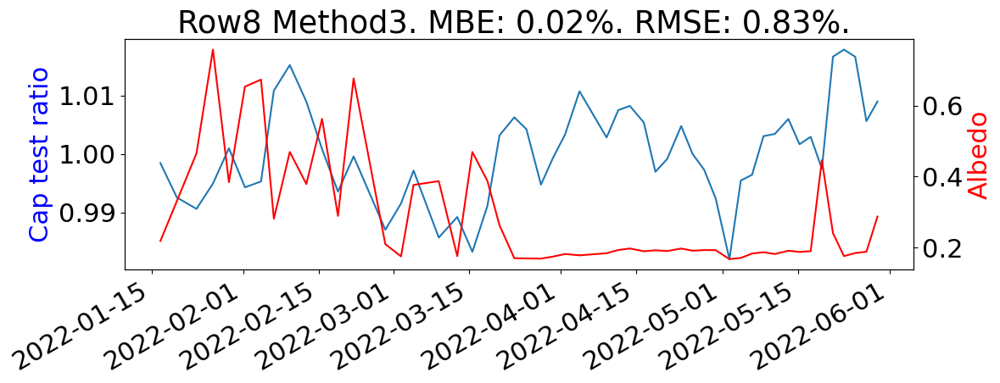

In [43]:
# run Row 8 monofacial regression.  das3 and pvsyst already constrained to 1/15 - 5/31
rownum = 8

das3.data['Gtotal'] = das3.data['Gfront_poa']+das3.data['row7RotatingAlbedometer_CM11_Down']

#das3.regression_cols = {'power':f'power_dc_inv{rownum}', 'poa':'row7RotatingAlbedometer_CM11_Up', 't_amb':'temp-amb-', 'w_vel':'wind--'}
das3.regression_cols = {'power':f'power_dc_inv{rownum}', 'poa':'Gfront_poa', 't_amb':'temp-amb-', 'w_vel':'wind--'}
regression_formula0 = das3.regression_formula



pvsyst_mono.set_regression_cols(power='kwh_kwp', poa='GlobInc', t_amb='T_Amb', w_vel='wind--')

#get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
(results_out, df) = runCaptest(pvsyst_mono, das3, run,  f'{rownum}_Method3')

plotAlbedo(results_out, das3, rownum, run, 'Method3')

<IPython.core.display.Javascript object>


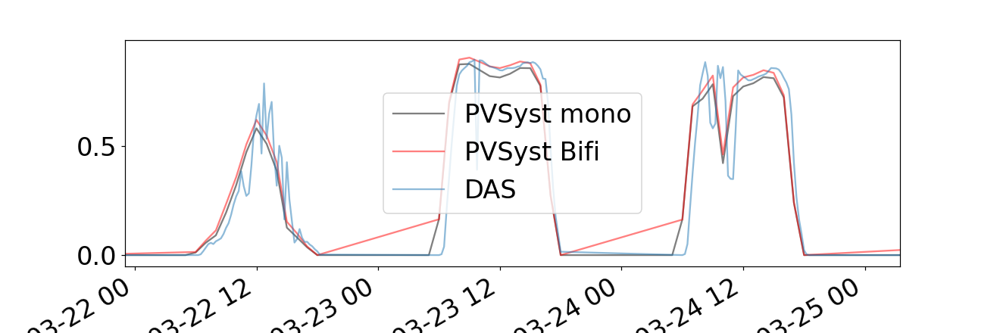

In [36]:

get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
#get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
fig = plt.figure()
plt.plot(pvsyst_mono.data['kwh_kwp'],'k',label='PVSyst mono', alpha=0.5)
plt.plot(pvsyst_bifi.data['kwh_kwp'],'r',label='PVSyst Bifi', alpha=0.5)
plt.plot(das3.data[f'power_dc_inv{rownum}'],label='DAS', alpha=0.5)
plt.legend()
fig.autofmt_xdate()


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter

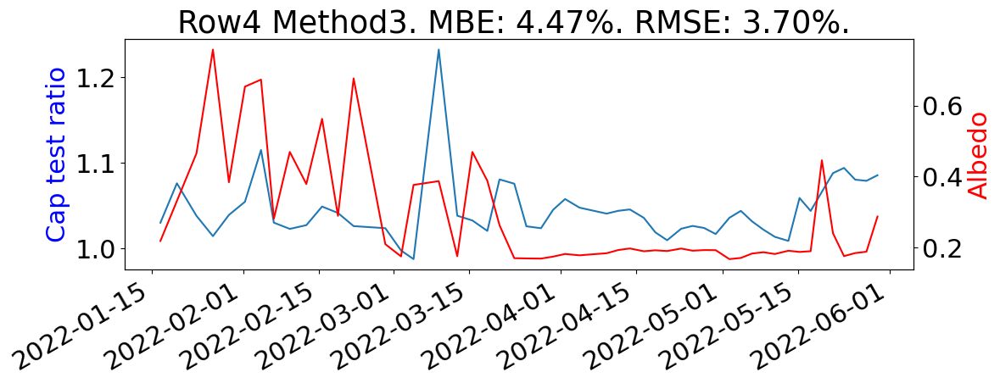

In [44]:
# run regression.  das3 and pvsyst already constrained to 1/15 - 5/31. Regress only Gtotal.

rownum = 4


das3.data['Gtotal'] = das3.data['Gfront_poa']+das3.data['row7RotatingAlbedometer_CM11_Down']

das3.regression_cols = {'power':f'power_dc_inv{rownum}', 'poa':'Gtotal', 't_amb':'temp-amb-', 'w_vel':'wind--'}

#das3.review_column_groups()

#print(das3.regression_formula)
regression_formula0 = das3.regression_formula


pvsyst_bifi.data['Gtotal'] = pvsyst_bifi.data['GlobInc']+pvsyst_bifi.data['E_rear_calc']
pvsyst_bifi.set_regression_cols(power='kwh_kwp', poa='Gtotal', t_amb='T_Amb', w_vel='wind--')

#get_ipython().run_line_magic('matplotlib', 'notebook') #interactive matplotlib
get_ipython().run_line_magic('matplotlib', 'inline') # inline plotting for .py file use
(results_out, df) = runCaptest(pvsyst_bifi, das3, run,  f'{rownum}_Method3')

plotAlbedo(results_out, das3, rownum, run, 'Method3')

In [45]:
# Run JEFF's special regression  (well, partly - regressing against Tmod, poa_total and poa_rear. Can't figure out how to add
#    extra regression factors...)
#regression_formula_jeff = 'power ~ poa + I(poa * poa_f)+ I(poa * poa_r)+ I(poa * t_amb) - 1'
pvsyst_bifi.regression_formula = regression_formula0
pvsyst_bifi.regression_cols = {'power':'kwh_kwp', 'poa':'Gtotal', 't_amb':'TArray', 'w_vel':'E_rear_calc'}

das3.regression_formula = regression_formula0
das3.regression_cols = {'power':f'power_dc_inv{rownum}', 'poa':'Gtotal','w_vel':'row7RotatingAlbedometer_CM11_Down', 't_amb':f'row{rownum}tmod_1'}


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter outlying points.


NOTE: Regression used to filter

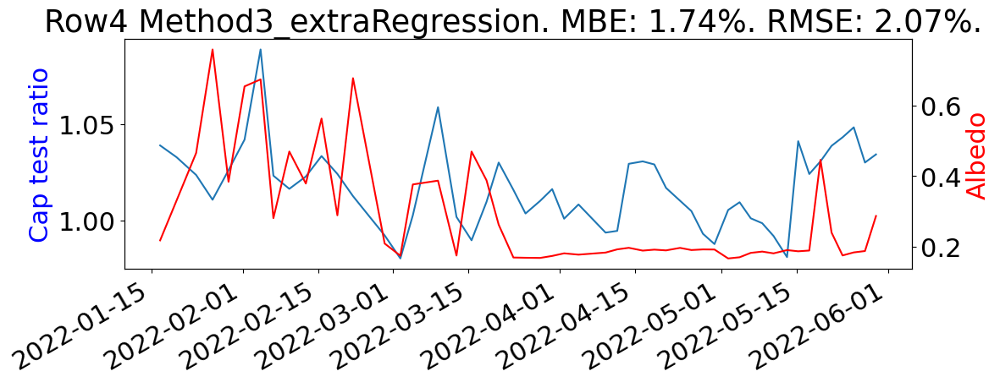

In [47]:
(results_out, df) = runCaptest(pvsyst_bifi, das3, run,  f'{rownum}_Method3_extraRegression')

plotAlbedo(results_out, das3, rownum, run, 'Method3_extraRegression')

In [73]:
savePowervPOA(df, results_out, rownum, run, 'Gtotal_Method3')
print(f'MBE: {MBE(results_out.ratio)*100:0.2f}%. RMSE: {RMSE(results_out.ratio)*100:0.2f}%. ' )



MBE: -100.00%. RMSE: 0.00%. 


In [41]:
print(f'elapsed time: {time.time() - starttime} s')

elapsed time: 1465.7360262870789 s
